# Practical Session 1 : (Histogram manipulation), Fourier domain, sub-sampling, linear filtering
The goal of this first practical session is to understand and try out python functions for image processing, and to get acquainted with image processing libraries, especially scikit-image. We will first go over how to visualize an image and its histogram. Then, we will try to understand the frequential content of an image thanks to the two-dimensional Fourier transform. Finally we will try out different linear filterings of our images.

You have to fill the notebook and answer to the question in the text cell each time there is the word **Answer**. 

**WRITE YOUR NAME** Mohamed Benyahia

## Image and histogram visualization
In order to visualize images and their histograms, we will use basic functions of scikit-image, numpy, and matplotlib. You can either use our images, or images that are stored in your Google Drive.

To download our images, execute the following command :

In [24]:
#Dowmloading images
!wget https://perso.telecom-paristech.fr/tupin/cours/imagesTP1.zip
!unzip -qq imagesTP1.zip 
!rm imagesTP1.zip
!rm -rf __MACOSX

'wget' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'unzip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'rm' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'rm' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.


The image should now appear in the "Files" menu on the left.To use the files stored in your google Drive, you need to click the "Mount Drive" button in the Files menu. Then, you will need to modify the path variable in the code, with the path name of your image in the drive Folder.

Here are the imports you should do : 

In [25]:
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import numpy.fft as fft

### Image visualisation
To visualize and load an image, you will use the function imread from skio. You can either load it in RGB or in greyscale.

rgb image shape : (1200, 1920, 3)


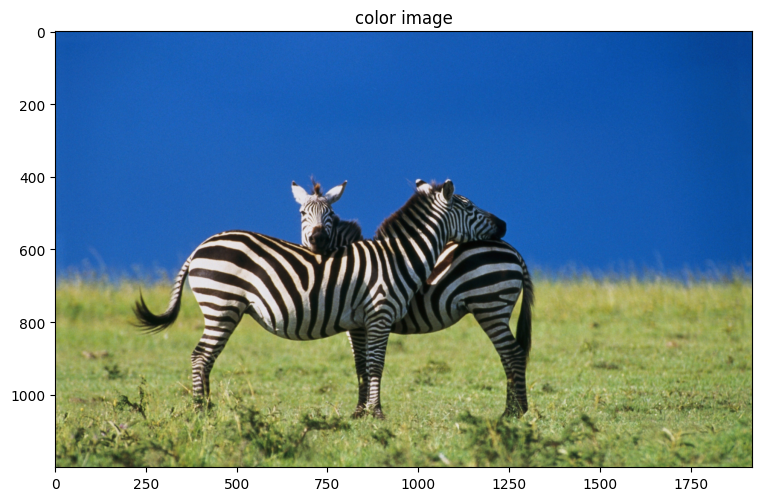

gray image shape : (512, 512)


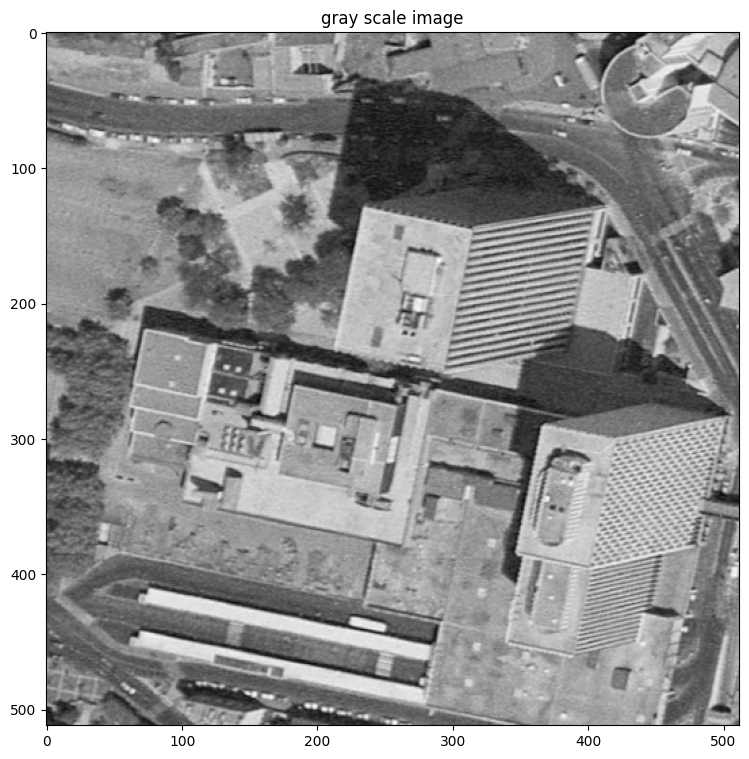

In [26]:
path = "imagesTP1//zebres.tif"
image_rgb = skio.imread(path) 
print("rgb image shape : "+str(image_rgb.shape))
plt.rcParams['figure.figsize'] = [9, 9] #control the size of the figure
plt.title("color image")
plt.imshow(image_rgb)
plt.show()

plt.rcParams['figure.figsize'] = [9, 9] #control the size of the figure
path = "imagesTP1/montreuil.tif"
image_gs = skio.imread(path,as_gray=True) #the default value for as_gray is False
print("gray image shape : "+str(image_gs.shape))
plt.title("gray scale image")
plt.imshow(image_gs, cmap = "gray")
plt.show()

### Histogram visualization
Multiple functions already exist to create an histogram. The histogram shows the distribution of the gray-levels or the colors of an image (gray-level in abscissa and number of pixels having this gray level in ordinate). You will see this topic in depth in the next course. Here we will just use the skimage.exposure.histogram function(), which takes as input the image and the number of bins of the histogram. It returns a couple of arrays of the form (height, value). We will use the plt.bar() function to plot the histogram.

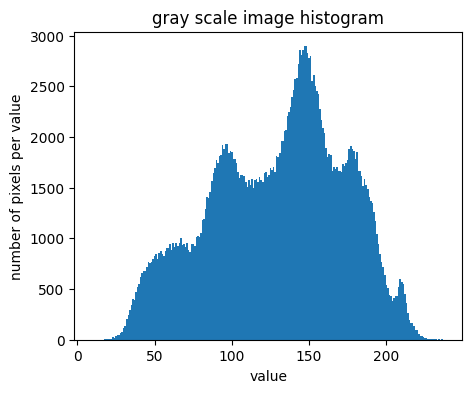

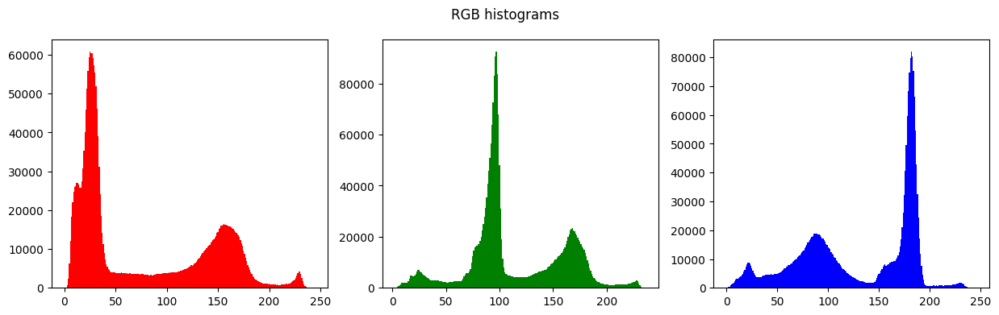

In [27]:
## grayscale histogram
img = image_gs
nbins = 256
histogram = skimage.exposure.histogram(image_gs, nbins)
plt.figure(figsize=(5,4))
plt.title("gray scale image histogram")
plt.xlabel("value")
plt.ylabel("number of pixels per value")
plt.bar(histogram[1],histogram[0], width = 1)
plt.show()

### color histograms
img = image_rgb
nbins = 255
red_histogram = skimage.exposure.histogram(image_rgb[...,0], nbins)
green_histogram = skimage.exposure.histogram(image_rgb[...,1], nbins)
blue_histogram = skimage.exposure.histogram(image_rgb[...,2], nbins)
fig, axs = plt.subplots(1, 3, figsize=(15,4))
fig.suptitle("RGB histograms")
axs[0].bar(red_histogram[1],red_histogram[0], width = 1, color = "red")
axs[1].bar(green_histogram[1],green_histogram[0], width = 1, color = "green")
axs[2].bar(blue_histogram[1],blue_histogram[0], width = 1, color = "blue")
plt.show()


## Fourier Domain
The Fourier Transform of an image allows us to analyze the frequential content of an image, by going from the spatial domain to the frequential domain. 
To compute the 2D Fourier transform of a grayscale image, we will use the fft2() function of the numpy.fft library. 

To display the Fourier transform centered on the (0,0) component, we will use
the fft.fftshift() to the Fourier transform.

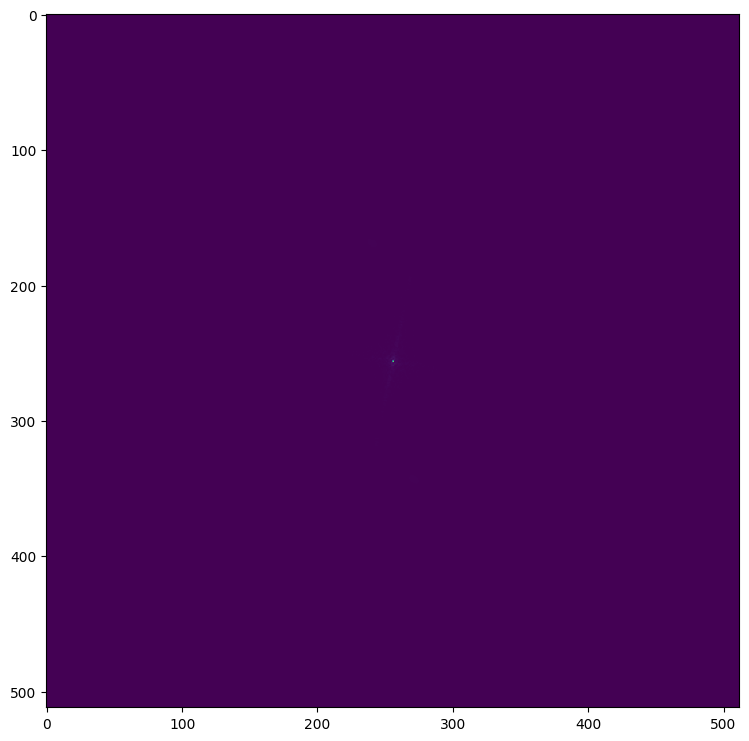

In [28]:
# complete this cell to compute the FT of img
img = skio.imread("imagesTP1/montreuil.tif")
image_fft = np.fft.fft2(img)
image_fft=np.fft.fftshift(image_fft)
plt.imshow(np.abs(image_fft))


Let's visualize the modulus of the Fourier transform by applying the log(abs(x)+0.1) to the FFT. (Remember, the Fourier transform is a complex number!)
Compare the result without using the log transform.

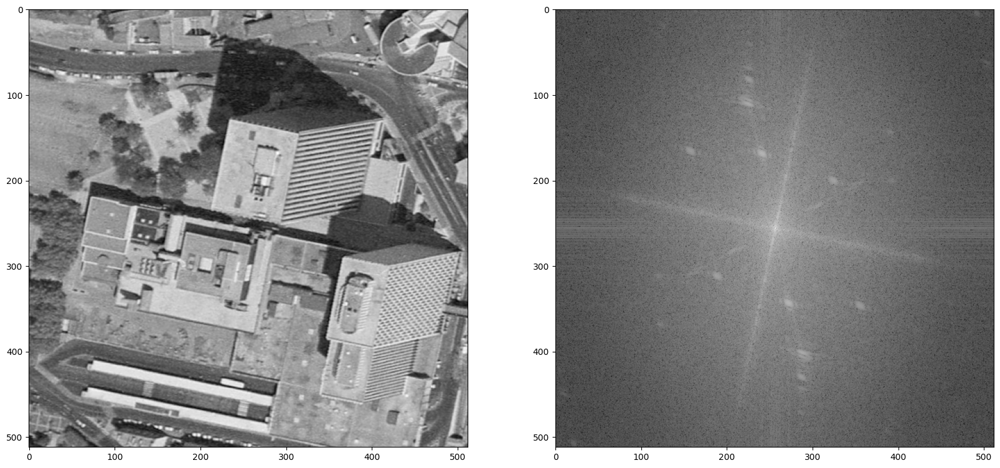

In [29]:
# Visualize the Fourier transform
modfft = np.log(np.abs(image_fft)+0.1)

fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(img, cmap='gray')
axs[1].imshow(modfft, cmap='gray')
plt.show()

Questions : 
- **Q**: why is important to visualize the logarithm of the Fourier Transform?
- **Answer** : It is important because the value of the peak at (0,0) is very high compared to other frequencies. 
- **Q** Explain the different lines and peaks in the FFT in relation to the image content.
- **Answer** : The horizontal and the vertical skew lines in the FFT corresponds to the disposition of the fields. 
The peaks correspond to the periodical stripes in the roofs of the houses.


Let us look at the phase of the image.


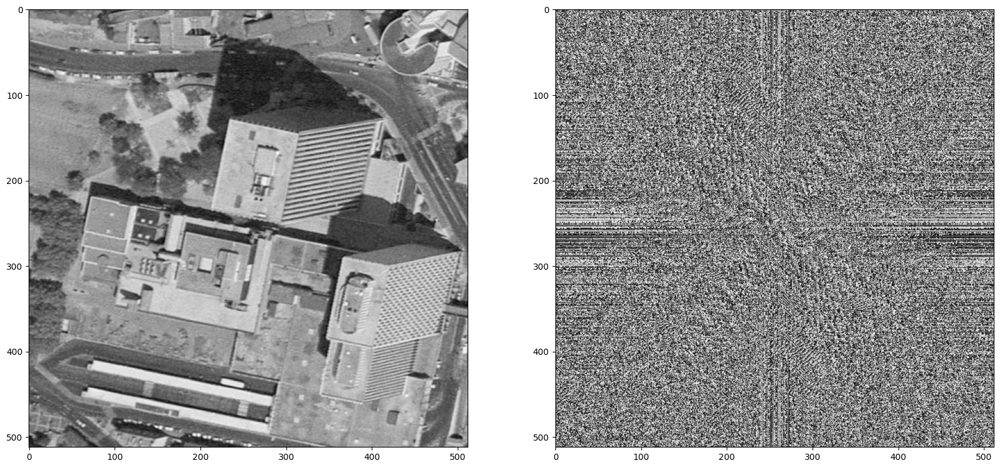

In [30]:
# we use np.angle to retrieve the complex argument
phifft = np.angle(image_fft)


fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(img, cmap='gray')
axs[1].imshow(phifft, cmap = "gray")
plt.show()

- **Q** : Can we easily interpret something from this image?
- **Answer**:No, we can't easily interpret something from this image.


To better understand the role of the phase image, let us invert modulus and phase of the Fourier transform of two images. For instance use "chapeau.tif" and "house.tif" to create new images with mixed spectrum (phase of one and amplitude of the other).

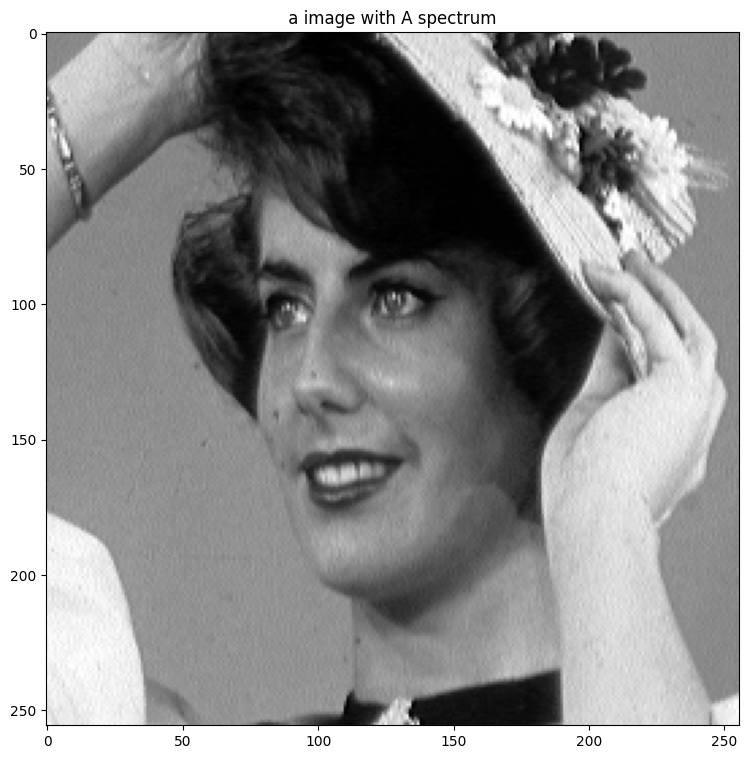

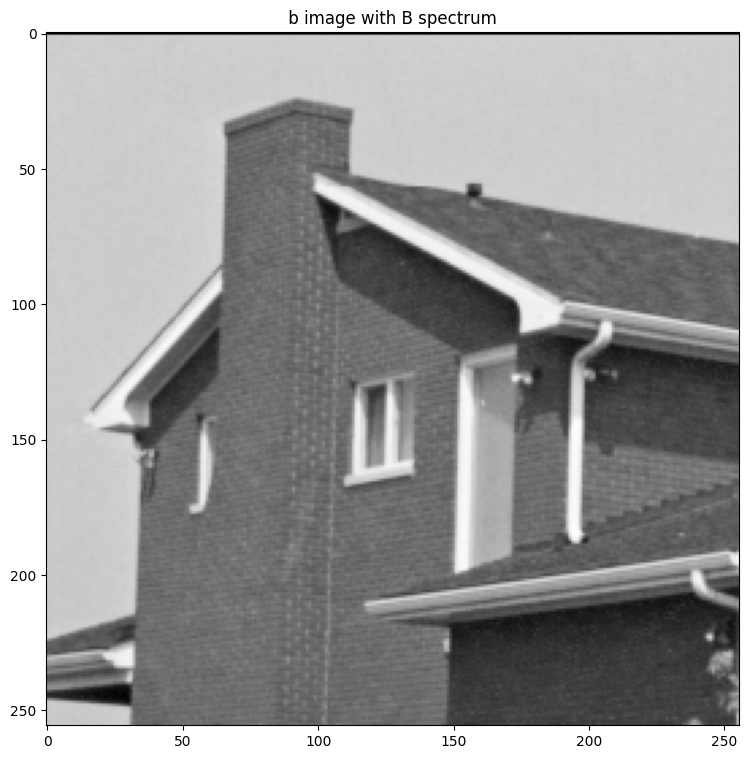

C:\Users\Dell\AppData\Local\Temp\ipykernel_14384\1275972181.py:12: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  j=np.complex(0,1)


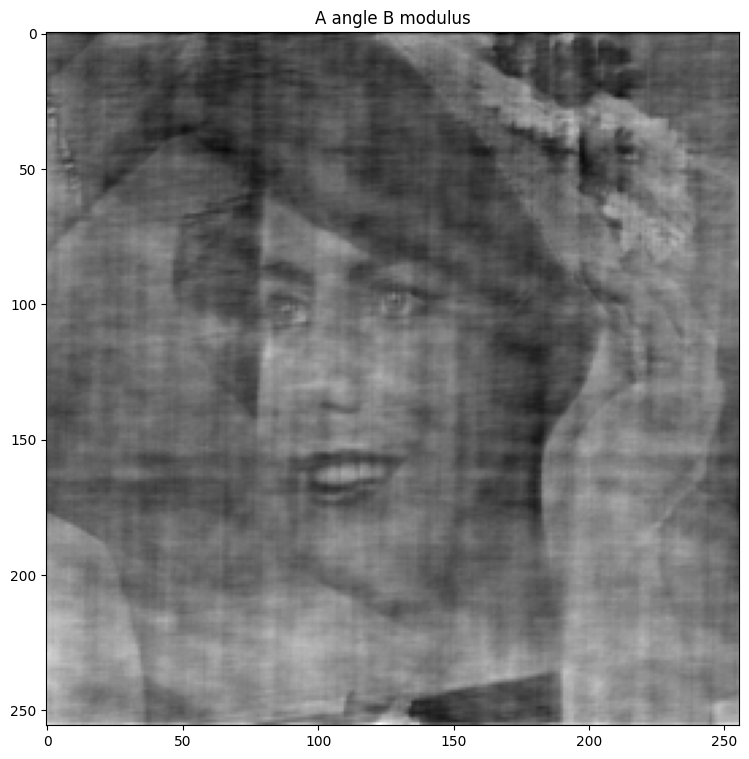

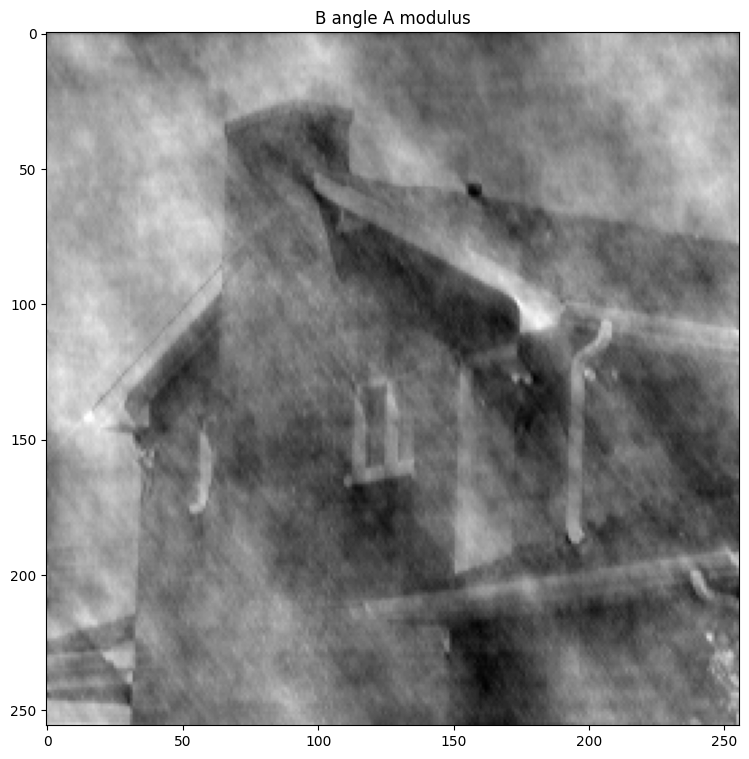

In [31]:
# analysis of the phase spectrum information
a=skio.imread("imagesTP1/chapeau.tif")
b=skio.imread("imagesTP1/maison.tif")
plt.title(" a image with A spectrum ")
plt.imshow(a, cmap = "gray")
plt.show()
plt.title(" b image with B spectrum ")
plt.imshow(b, cmap = "gray")
plt.show()

A=fft.fft2(a); B=fft.fft2(b);
j=np.complex(0,1)
# create a new Fourier transform by mixing phase and modulus of the Fourier transforms
# transformation keeping the A angle and B modulus
Ap=np.abs(B)*np.exp(j*np.angle(A))
# transformation keeping the B angle and A modulus
Bp=np.abs(A)*np.exp(j*np.angle(B))
#Going back to the image domain (use ifft2 and real part)
ap=np.real(np.fft.ifft2(Ap))
plt.title("A angle B modulus")
plt.imshow(ap, cmap = "gray");
plt.show()
#Going back to the image domain (use ifft2 and real part)
bp=np.real(np.fft.ifft2(Bp))
plt.title("B angle A modulus")
plt.imshow(bp,cmap = "gray");
plt.show()

- **Q** : In which image can you recognize the content of the original image ?
- **Answer** : We recognize the content of the original image in the image which is the IFFT2 that contains the phase of the FFT .



Another experiment is the modification of the phase of the Fourier transform on a stationary image (almost invariant content by translation), like a texture image. Take the "bois.tif" (or an image with a texture like "strawmat" or "skin")image and modify the phase of the Fourier transform to replace it by a random value between $[-\pi;\pi]$. Do the same experiment with an image like "maison". 

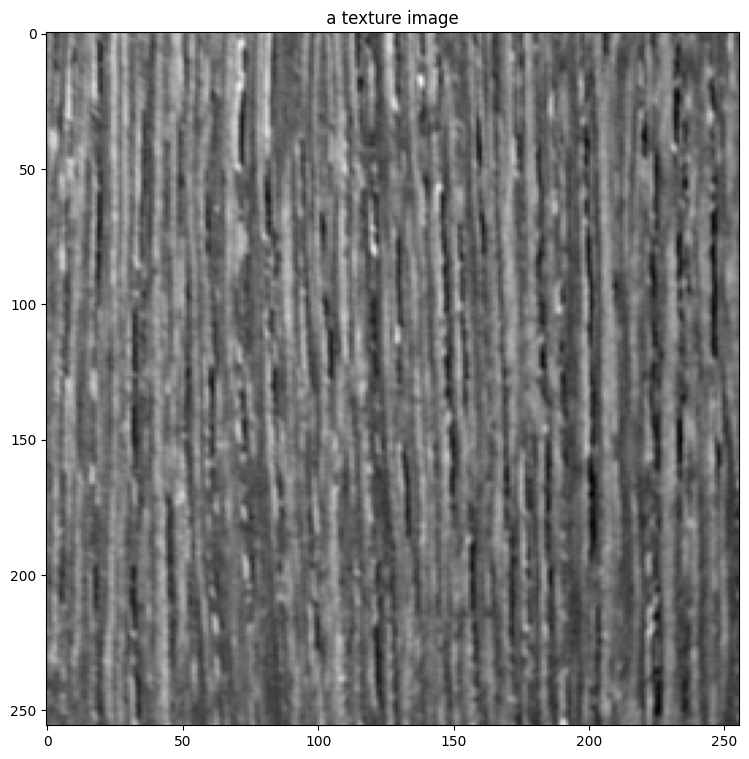

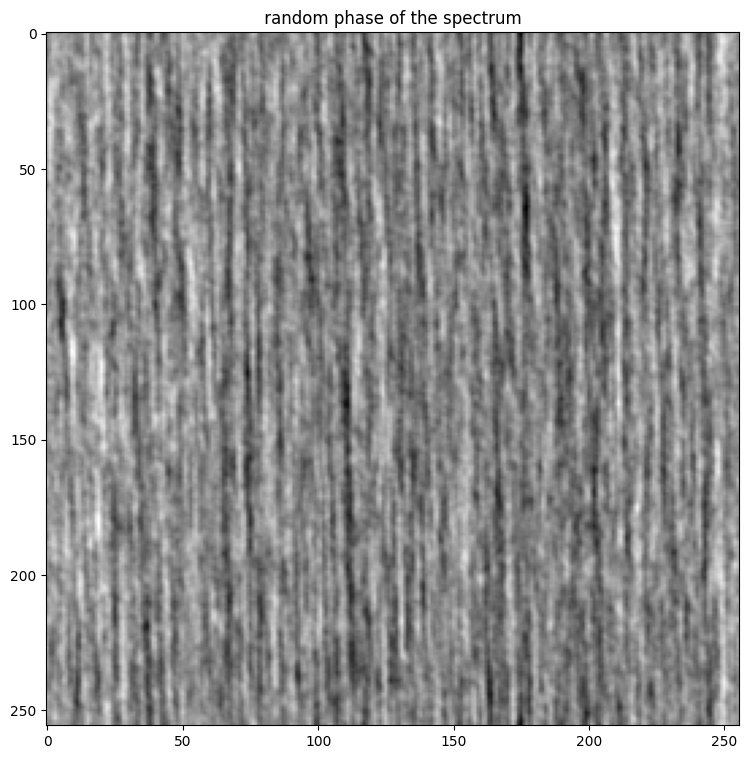

In [32]:
#texture synthesis using random phase
a=skio.imread("imagesTP1/bois.tif")
(m,n)=a.shape
plt.title(" a texture image ")
plt.imshow(a, cmap = "gray");
plt.show()

#compute the FFT of a 
A=np.fft.fft2(a)
#compute a random image with values uniformly drawn between 0 and 2pi 
b=np.random.uniform(-np.pi,np.pi,(m,n))
#compute the new spectrum
C=np.abs(A)*np.exp(j*b)
#compute the new image 
c=np.real(np.fft.ifft2(C))
# visualization of the new image
plt.title(" random phase of the spectrum ")
plt.imshow(c, cmap = "gray");
plt.show()


- **Q** : What is the influence of the random phase on the synthetized image ?
- **Answer**:We see nearly the same image. The random phase doesn't have a big influence on the synthetized image.

### Sub-sampling an image
Images can be very large and thus use a lot of memory. It is sometimes needed to smallen those images using a sub-sampling technique. However, when done unproperly, the sub-sampled image can present artifacts. Thanks to the Fourier transform, we will understand what is the underlying problem.

image shape : (512, 512)
subsampled image shape : (256, 256)


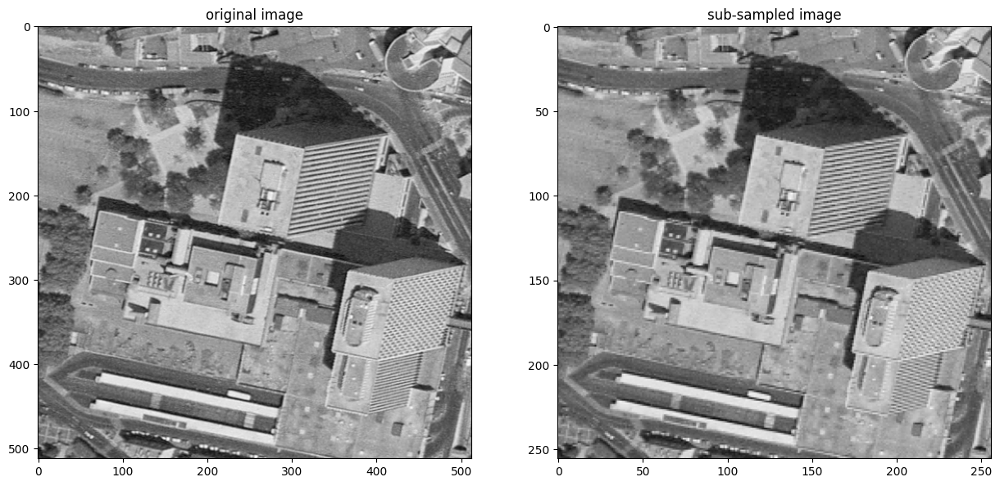

In [33]:
# subsampling the image by a factor of 2 in each direction
(w,l)=img.shape
img_subsampled = np.zeros((int(w/2),int(l/2)))
for i in range(0,int(w/2)):
    for j in range(0,int(l/2)):
        img_subsampled[i][j]=img[2*i][2*j]

print("image shape : "+str(img.shape))
print("subsampled image shape : "+str(img_subsampled.shape))

#visualize the images
fig, axs = plt.subplots(1, 2, figsize=(15,15))
axs[0].imshow(img, cmap='gray')
axs[0].set_title("original image")
axs[1].imshow(img_subsampled, cmap='gray')
axs[1].set_title("sub-sampled image")
plt.show()


- **Q**: Describe the visual artifacts you see in the sub-sampled image
- **Answer** : We observe in the fields the apparition of stripes in the opposite direction of the original ones.


Let's compare the Fourier Transform of the subsampled image to the one of the original image:

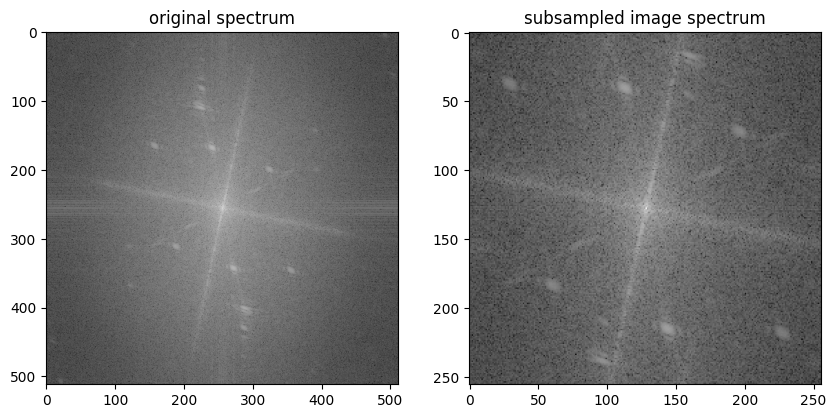

In [34]:
##compute the modulus of the subsampled image
modfft_sub = np.log(np.abs(np.fft.fftshift(np.fft.fft2(img_subsampled)))+0.1)

##visualize the two images
fig, axs = plt.subplots(1, 2, figsize=(10,10))
axs[0].imshow(modfft, cmap='gray')
axs[0].set_title("original spectrum")
axs[1].imshow(modfft_sub, cmap='gray')
axs[1].set_title("subsampled image spectrum")
plt.show()

- **Q** : What is the phenomenon we observe ? How can you explain it ?
- **Answer** : We observe the apparition of new artefacts. We can explain it by the phenomenon of aliasing. 


- **Q** : Can you think of a solution to solve this problem ?
- **Answer** : We can apply a low-pass smooth filter before subsampling.

## Linear Filtering
### Low pass Filtering

In order to smooth or to denoise an image, a very simple way is to apply a local mean filtering. In order to do that, we would convolve the image with a uniform kernel :
$$k = \frac{1}{25}\times\mathbb{1}_{(5,5)}$$

$$I_{smooth} = k*I$$

Let's build this filter and observe its Fourier transform, in a larger image. Create a binary image of size (512,512) with the filter at its center, and visualize its Fourier Transform. 

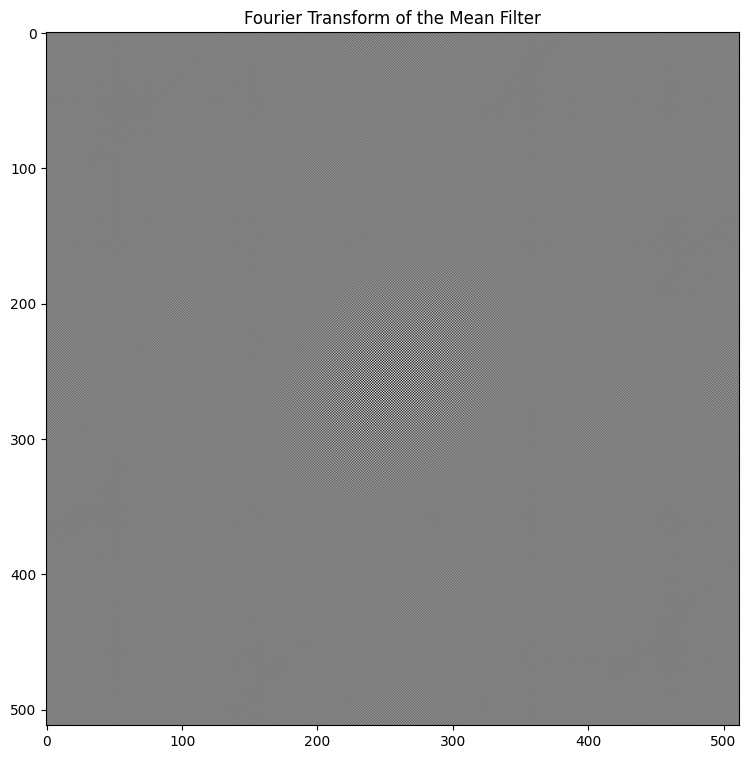

In [35]:
##define the kernel (mean filter)
kernel = (1/25)*np.ones((5,5))
##introduce the kernel in the middle of an image of zeros with the original size
larger_image = np.pad(kernel,(int((512-5)/2),int((512+1-5)/2)))
kernel_fft = np.real(np.fft.fftshift(np.fft.fft2(larger_image)))
plt.title("Fourier Transform of the Mean Filter")
plt.imshow(kernel_fft, cmap = "gray")
plt.show()



- **Q**: Does that image matches to your prediction ?
- **Answer**: The kernel is a door function in x and y and we know that the Fourier Transform of a door function is a cardinal sinus in two dimensions. This is why we observe in the center many points disposed according to a sinus cardinal.



Let's apply this filter to the image using the scipy.signal.convolve2d() function.

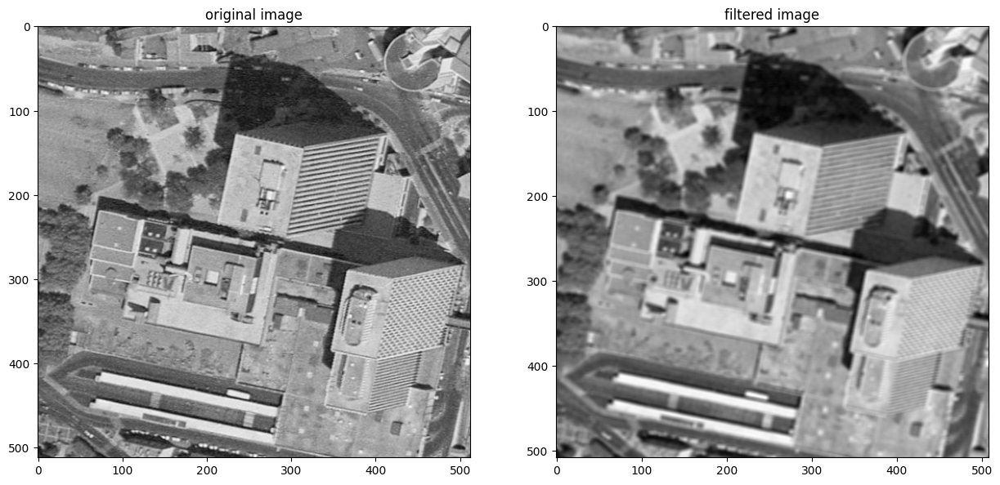

In [36]:
from scipy.signal import convolve2d
# filtered image (use convolve2D and mode="valid")
img_filtered = convolve2d(img,kernel,mode='valid',boundary='symm')

#visualize images
fig, axs = plt.subplots(1, 2, figsize=(15,15))
axs[0].imshow(img, cmap='gray')
axs[0].set_title("original image")
axs[1].imshow(np.absolute(img_filtered), cmap='gray')
axs[1].set_title("filtered image")
plt.show()

- **Q**: What is the aspect of this image ? 
- **Answer**: This image is blurred.
 

Let's visualize the FFT of the filtered image.

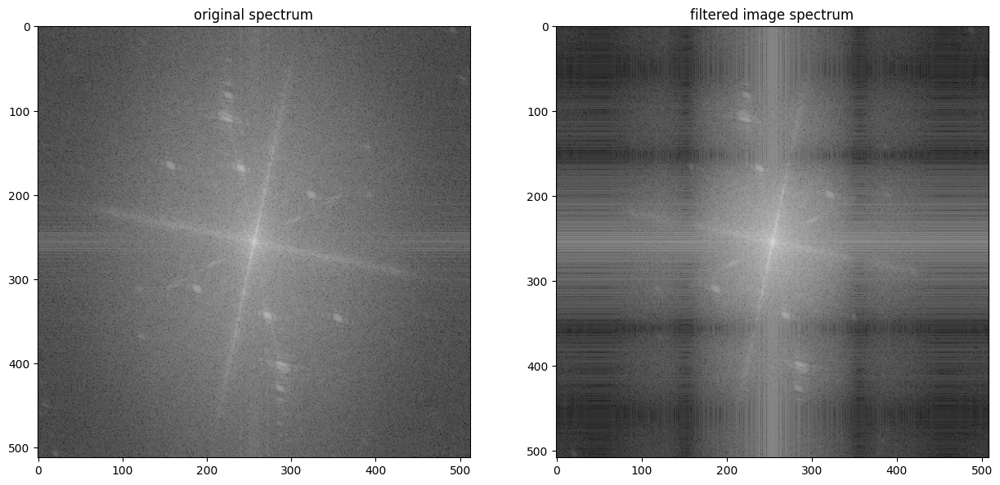

In [37]:
##compute the modulus of the filtered image
modfft_f = np.log(np.abs(np.fft.fftshift(np.fft.fft2(img_filtered)))+0.1)

##visualize the two images
fig, axs = plt.subplots(1, 2, figsize=(15,15))
axs[0].imshow(modfft, cmap='gray')
axs[0].set_title("original spectrum")
axs[1].imshow(modfft_f, cmap='gray')
axs[1].set_title("filtered image spectrum")
plt.show()

- **Q** : Does this image follows its predicted value ? (Explain your reasoning) What would happen if we do the sub-sampling on this filtered image ?
- **Answser** : Yes, this image follows its predicted value which is the product of the original spectrum and the fourier transform of our kernel. We observe that it cut the high frequencies. If we do sub-sampling on this filtered image we won't observe the apparition of new artifacts.


To illustrate the interest of low-pass filtering, we will apply it to a "noisy" image. In this PW, we will simply add noise to the image and create a noisy image. 

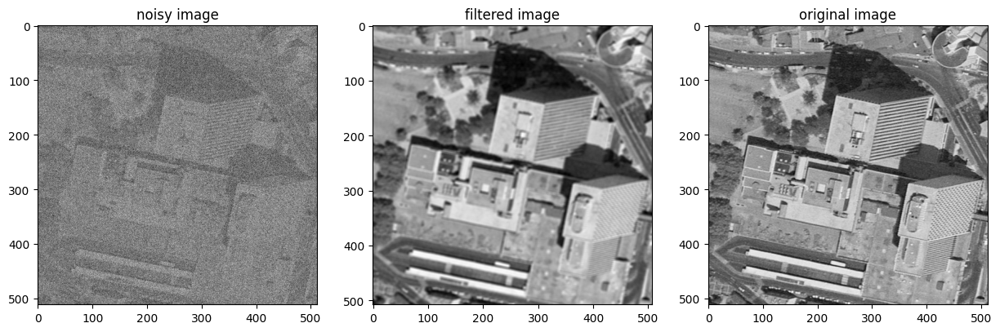

In [38]:
def add_gaussian_noise(img_in,sigma_noise = 0.05):
  #np.random.normal creates random samples following a gaussian pdf
  gaussian_noise = np.random.normal(0,sigma_noise,(img_in.shape[0],img_in.shape[1]))
  img_out = img_in+gaussian_noise
  return img_out
  
noisy_image = add_gaussian_noise(img,100)

filtered_image = convolve2d(noisy_image,kernel,mode='valid',boundary='symm')


## display the noisy image, the filtered image and the original image
#visualize images
fig, axs = plt.subplots(1, 3, figsize=(15,15))
axs[0].imshow(noisy_image, cmap='gray')
axs[0].set_title("noisy image")
axs[1].imshow(np.absolute(img_filtered), cmap='gray')
axs[1].set_title("filtered image")
axs[2].imshow(img, cmap='gray')
axs[2].set_title("original image")
plt.show()

**Q :** Does this low pass filtering reduce the influence of the noise? Could you think of another kernel to apply a low pass filter?

**Answer :** Yes, it reduces the influence of the noise because it divides the variance of the noise by 25.
We could think of the Gaussian kernel.

**Q :** How are the edges affected by this filtering ? Do you think that a median filter would be better?

**Answer :** We are losing the information about the edges. I think a median filter would do better.

**Q :** Another interesting application of the low pass filtering is subsampling. In the following cell, implement a subsampling with and without low pass filtering (as we did in the previous section) and comment on the results. Is the result any better ? Are the artifacts corrected? 

**Answer :** The result is better. The generated artifacts disappeared.



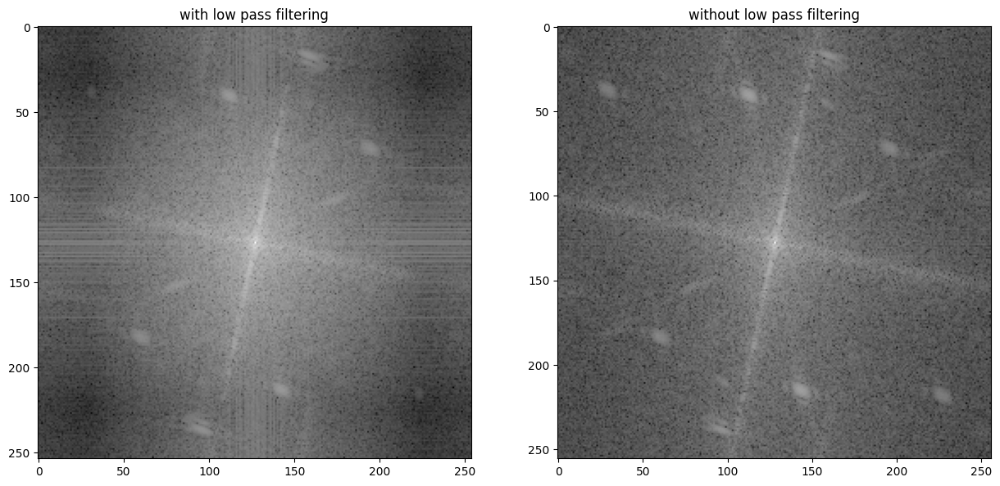

In [39]:
(w,l)=img_filtered.shape
img_subsampled_filter = np.zeros((int(w/2),int(l/2)))
for i in range(0,int(w/2)):
    for j in range(0,int(l/2)):
        img_subsampled_filter[i][j]=img_filtered[2*i][2*j]

modfftSub_f = np.log(np.abs(np.fft.fftshift(np.fft.fft2(img_subsampled_filter)))+0.1)
modfftSub = np.log(np.abs(np.fft.fftshift(np.fft.fft2(img_subsampled)))+0.1)
#visualize the images
fig, axs = plt.subplots(1, 2, figsize=(15,15))
axs[0].imshow(modfftSub_f, cmap='gray')
axs[0].set_title("with low pass filtering")
axs[1].imshow(modfftSub, cmap='gray')
axs[1].set_title("without low pass filtering")
plt.show()

### High pass Filtering

###Contour detection with Prewitt filtering

A simple way to detect contours in images is to apply a high pass filter to our image. In this section we will implement a simple Prewitt filter.

The Prewitt filter convolves the kernel  $K = \begin{pmatrix}
-1 & 0 & 1\\
-1 & 0 & 1 \\
-1 & 0 & 1 \\
\end{pmatrix} $ to the image for the horizontal filtering, and its transpose for the vertical filtering. The filtering formula is the following :  $$ y = \frac{1}{2}(K*x + K^T*x).$$
Let's implement this filter and visualize it's results.

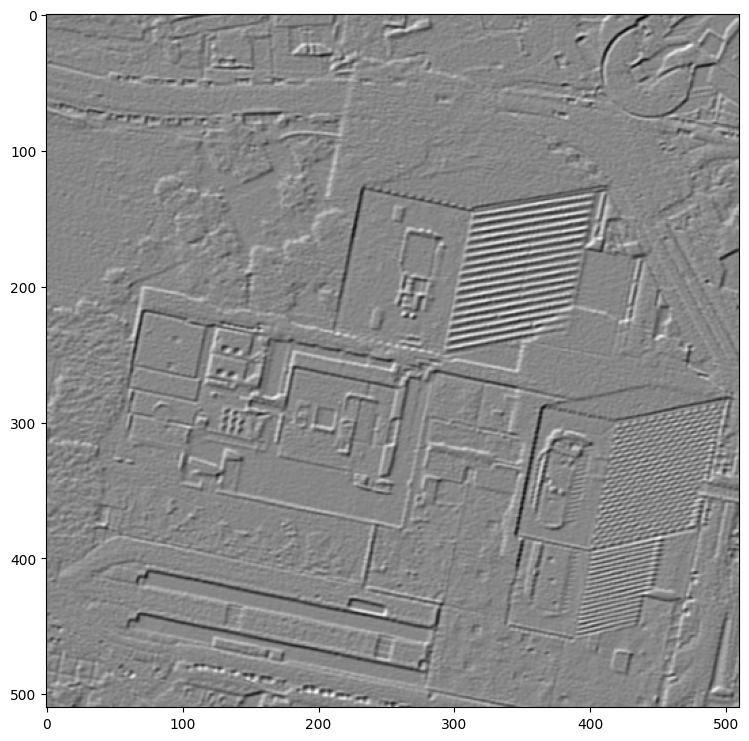

In [40]:
def prewitt_filtering(img):
  kernel = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
  img_filtered_hor = convolve2d(img,kernel,mode='valid')
  img_filtered_ver = convolve2d(img,np.transpose(kernel),mode='valid')
  img_filtered = (1/2)*(img_filtered_hor+img_filtered_ver)
  return img_filtered

filtered_img = prewitt_filtering(img)

plt.imshow(filtered_img, cmap = "gray")
plt.show()

**Q :** What is the effect of this filter on the image ? 

**Answer :** This filter helps to highlight the contours of the image by making an approximation of the derivative.
